In [1]:
import pandas as pd
import glob
import matplotlib.pyplot as plt
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import seaborn as sns
import math
import statistics
import warnings
import numpy as  np
import ast
import re
from scipy.signal import resample
import tkinter as tk
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import pingouin as pg
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')

df = pd.read_json(r"C:\Users\veoni\Documents\GitHub\MTE_DLAB\Analysis\df_manrev.json")

In [2]:
mean_data_points = df['downsampled_traj'].apply(lambda x: len(x)).mean()
print(mean_data_points)
df['new_timestamps'] = df['timestamps']
df['new_timestamps'] = df['downsampled_traj'].apply(lambda x: [i * 0.01 for i in range(len(x))])
df['new_timestamps'] = df['new_timestamps'].apply(lambda x: [round(i, 2) for i in x])





117.91166486096064


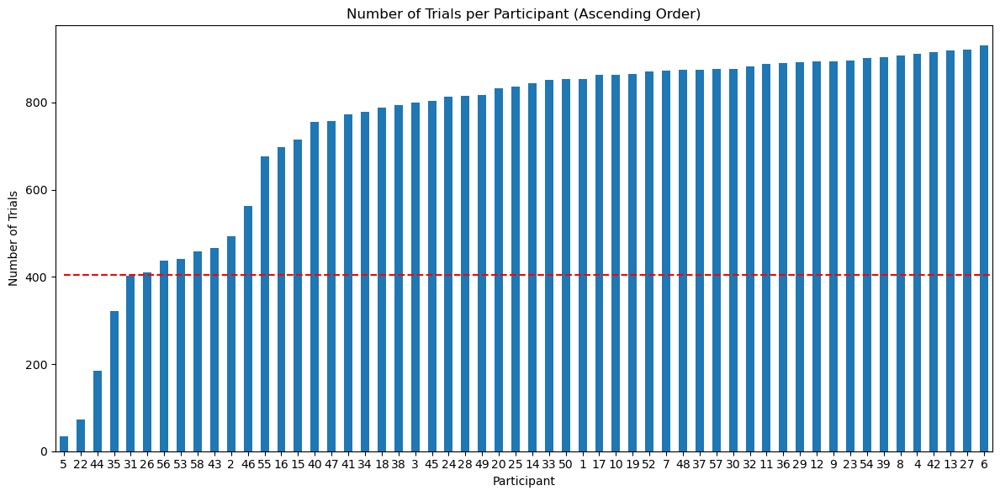

In [3]:
pt_trial = df['pt_num'].value_counts().sort_values(ascending=True)
participants_below_400 = df['pt_num'].value_counts().loc[lambda x: x < 405].index.tolist()
participants_below_400

pt_trial_sorted = pt_trial.sort_values()

plt.figure(figsize=(12, 6))  # Increase the figure size

pt_trial_sorted.plot(kind='bar')
plt.xlabel('Participant')
plt.ylabel('Number of Trials')
plt.title('Number of Trials per Participant (Ascending Order)')
plt.hlines(405, 0, 70, colors='r', linestyles='dashed')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()


In [4]:
#Drop participants with less than 400 trials and 31
df = df[~df['pt_num'].isin(participants_below_400)]


In [5]:
def cut_and_fill_traj(traj, length=81):
    last_index = len(traj) - 1
    start_index = max(0, last_index - length + 1)
    end_index = last_index + 1
    
    traj = traj[start_index:end_index]
    
    if len(traj) < length:
        last_x, last_y = traj[-1]
        traj.extend([(last_x, last_y)] * (length - len(traj)))
    
    return traj

In [6]:
df['cut_traj'] = [cut_and_fill_traj(traj, length=81) for traj in df['downsampled_traj']]
df['x_values'] = df['cut_traj'].apply(lambda traj: [point[0] for point in traj])
df['y_values'] = df['cut_traj'].apply(lambda traj: [point[1] for point in traj])


In [7]:
avg_onset_traj = df['cut_traj'].apply(lambda x: len(x)).mean()

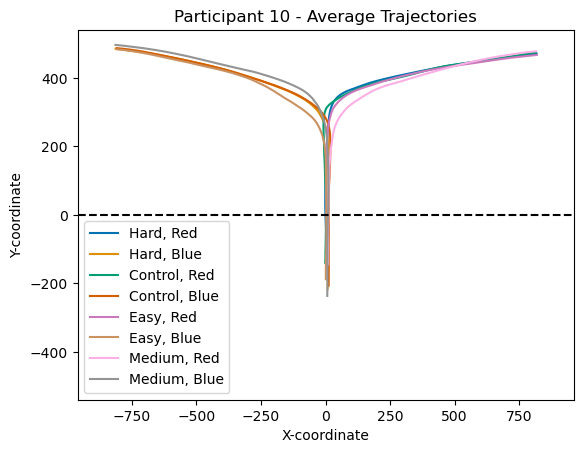

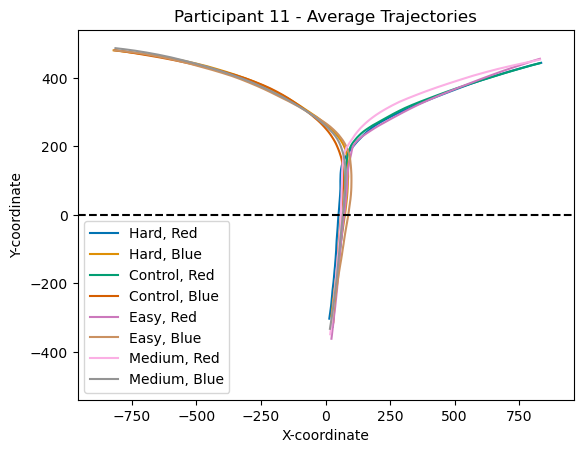

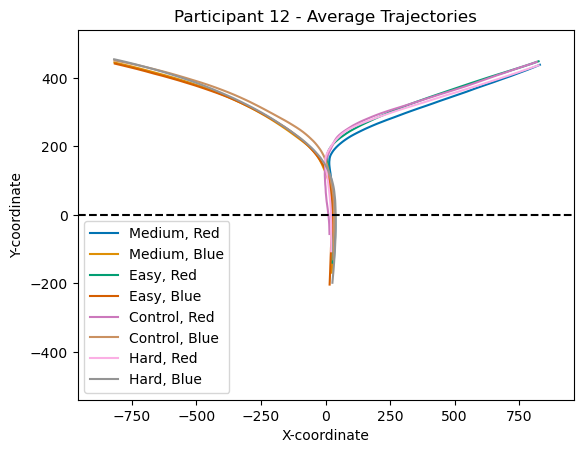

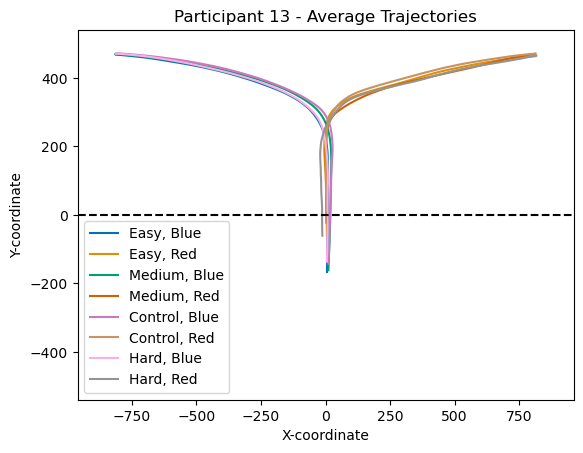

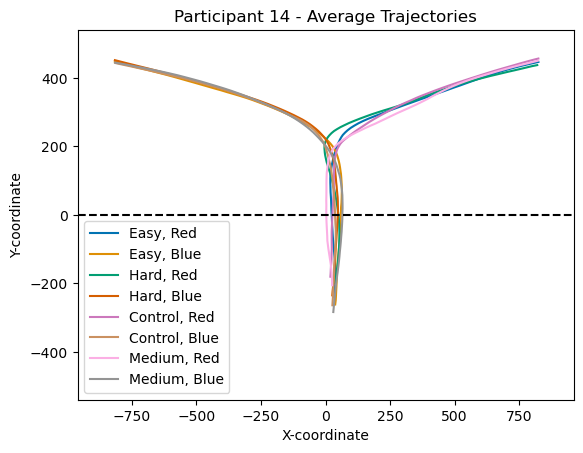

...

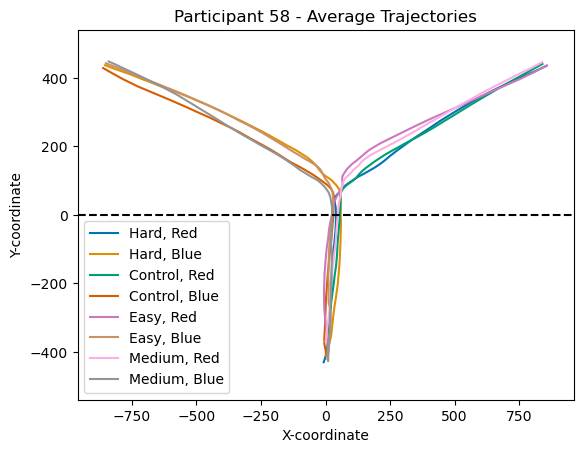

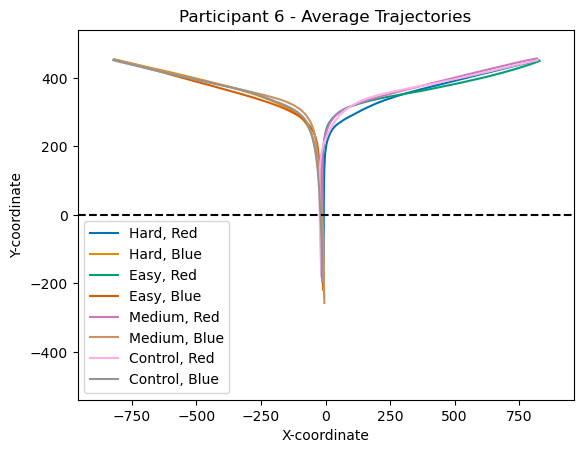

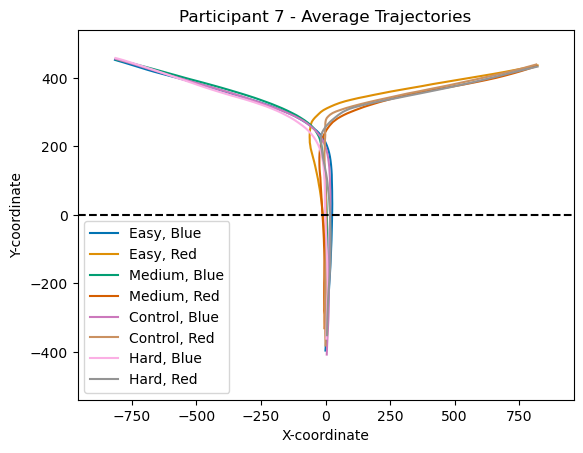

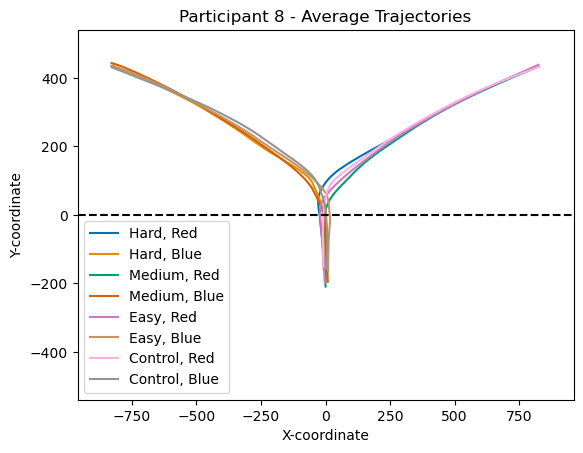

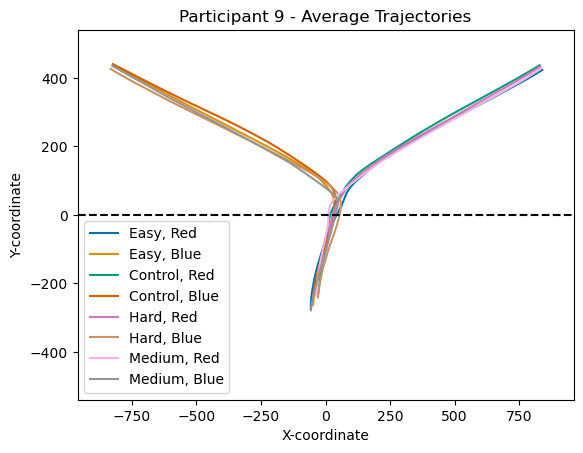

In [8]:
participants = df['pt_num'].unique()

# Set the color palette to colorblind
sns.set_palette("colorblind")

for participant in participants:
    plt.figure()  # Create a new figure for each participant
    
    conditions = df[df['pt_num'] == participant]['difficulty'].unique()
    choices = df[df['pt_num'] == participant]['choice'].unique()
    
    for condition in conditions:
        for choice in choices:
            df_filtered = df[(df['pt_num'] == participant) & (df['difficulty'] == condition) & (df['choice'] == choice)]
            
            average_x_traj = np.nanmean(df_filtered['x_values'].tolist(), axis=0)
            average_y_traj = np.nanmean(df_filtered['y_values'].tolist(), axis=0)
            
            plt.plot(average_x_traj, average_y_traj, label=f'{condition}, {choice}')
    
    plt.xlabel('X-coordinate')
    plt.ylabel('Y-coordinate')
    plt.xlim(-960, 960)
    plt.ylim(-540, 540)
    plt.hlines(0, -960, 960, colors='black', linestyles='dashed')
    plt.title(f'Participant {participant} - Average Trajectories')
    plt.legend()
    #plt.savefig(f'interim plots_1/participant_{participant}_nan_avg.pdf')
    plt.show()
    plt.close()

In [9]:
#Adding C values to the dataframe
def assign_muval(row):
    if row['difficulty'] == 'Control':
        return 0.50
    elif row['difficulty'] == 'Easy' and row['true_value'] == 'Blue':
        return 0.455
    elif row['difficulty'] == 'Easy' and row['true_value'] == 'Red':
        return 0.545
    elif row['difficulty'] == 'Medium' and row['true_value'] == 'Blue':
        return 0.47
    elif row['difficulty'] == 'Medium' and row['true_value'] == 'Red':
        return 0.53
    elif row['difficulty'] == 'Hard' and row['true_value'] == 'Blue':
        return 0.48
    elif row['difficulty'] == 'Hard' and row['true_value'] == 'Red':
        return 0.52

df['muval'] = df.apply(assign_muval, axis=1)
# Create an instance of MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Rescale the value assignments
df['muval_rescaled'] = scaler.fit_transform(df['muval'].values.reshape(-1, 1))



In [10]:
data_files = glob.glob(r'../Squircle experiment/data/*.json')
# Load the dataset
df_raw = pd.DataFrame()
for i in range(len(data_files)):
    temp_df = pd.read_json(data_files[i])
    temp_df['previous_diff'] = temp_df['difficulty'].shift(fill_value=None)
    temp_df['previous_trueval'] = temp_df['true_value'].shift(fill_value=None)
    df_raw = pd.concat([df_raw, temp_df])
df_raw = df_raw.drop(df_raw.columns[df_raw.columns.str.contains('Unnamed', case=False)], axis=1)

In [11]:
#Adding C values to the dataframe
def assign_muval(row):
    if row['previous_diff'] == 'Control':
        return 0.50
    elif row['previous_diff'] == 'Easy' and row['previous_trueval'] == 'Blue':
        return 0.455
    elif row['previous_diff'] == 'Easy' and row['previous_trueval'] == 'Red':
        return 0.545
    elif row['previous_diff'] == 'Medium' and row['previous_trueval'] == 'Blue':
        return 0.47
    elif row['previous_diff'] == 'Medium' and row['previous_trueval'] == 'Red':
        return 0.53
    elif row['previous_diff'] == 'Hard' and row['previous_trueval'] == 'Blue':
        return 0.48
    elif row['previous_diff'] == 'Hard' and row['previous_trueval'] == 'Red':
        return 0.52
    else:
        return 'NAN'

df_raw['prev_evidence'] = df_raw.apply(assign_muval, axis=1)
# Create an instance of MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Rescale the value assignments
df_raw['prev_evidence_rescaled'] = scaler.fit_transform(df_raw['prev_evidence'].values.reshape(-1, 1))

In [12]:
# Check if 'previous_evidence_rescaled' column exists in df_raw
df_11 = df.merge(df_raw[['trial_nbr', 'pt_num', 'prev_evidence_rescaled']], on=['trial_nbr', 'pt_num'], how='left')
df_11 = df_11.drop_duplicates(subset=['trial_nbr', 'pt_num'], keep='first')


Participant 10, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8680
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.457
Time:                        11:18:41   Log-Likelihood:                -4251.9
No. Observations:                 826   AIC:                             8512.
Df Residuals:                     822   BIC:                             8531.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.6940   

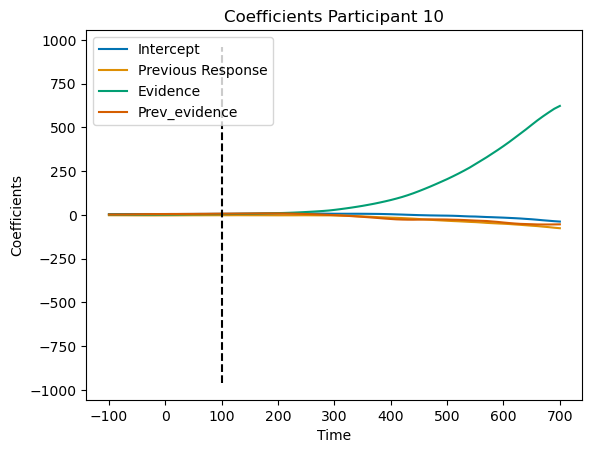

Participant 11, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.7747
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.508
Time:                        11:18:44   Log-Likelihood:                -4528.1
No. Observations:                 849   AIC:                             9064.
Df Residuals:                     845   BIC:                             9083.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.5004   

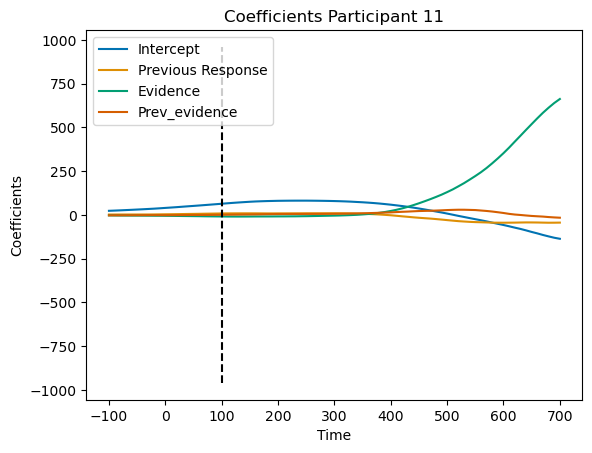

Participant 12, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     3.656
Date:                Tue, 02 Apr 2024   Prob (F-statistic):             0.0123
Time:                        11:18:45   Log-Likelihood:                -4677.9
No. Observations:                 858   AIC:                             9364.
Df Residuals:                     854   BIC:                             9383.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.9827   

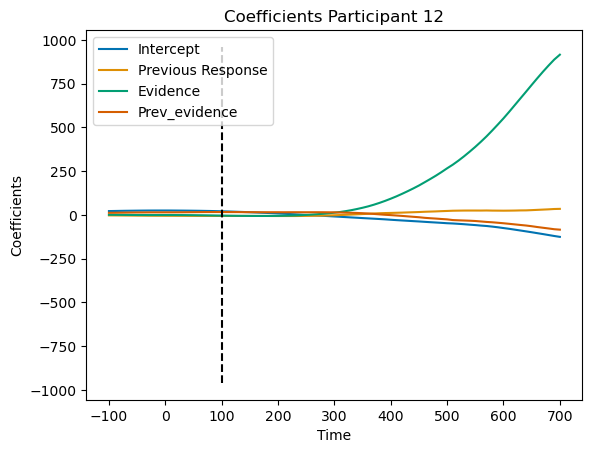

Participant 13, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     4.807
Date:                Tue, 02 Apr 2024   Prob (F-statistic):            0.00251
Time:                        11:18:47   Log-Likelihood:                -4701.9
No. Observations:                 904   AIC:                             9412.
Df Residuals:                     900   BIC:                             9431.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.7218   

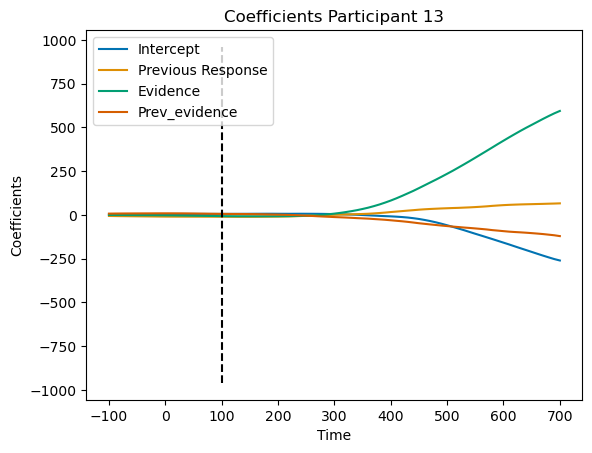

Participant 14, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     3.121
Date:                Tue, 02 Apr 2024   Prob (F-statistic):             0.0254
Time:                        11:18:49   Log-Likelihood:                -4924.0
No. Observations:                 824   AIC:                             9856.
Df Residuals:                     820   BIC:                             9875.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         30.2128   

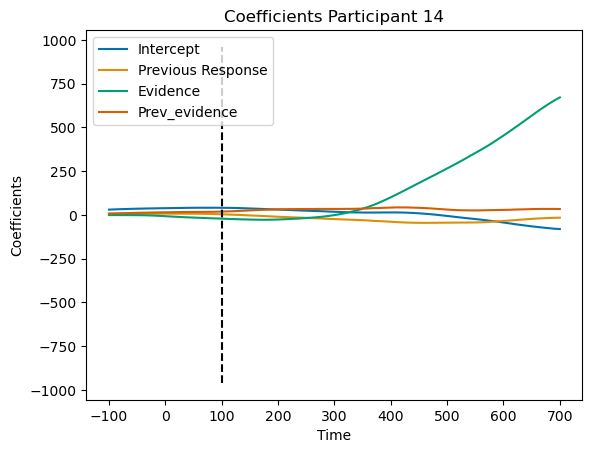

Participant 15, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.2656
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.850
Time:                        11:18:50   Log-Likelihood:                -3444.9
No. Observations:                 668   AIC:                             6898.
Df Residuals:                     664   BIC:                             6916.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.6335   

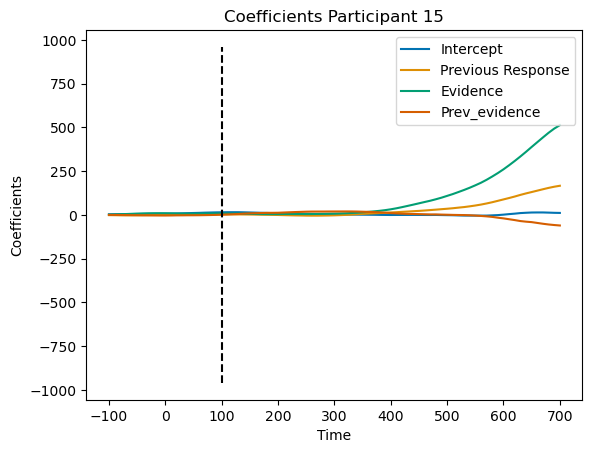

Participant 16, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.7680
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.512
Time:                        11:18:52   Log-Likelihood:                -3871.5
No. Observations:                 668   AIC:                             7751.
Df Residuals:                     664   BIC:                             7769.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0341   

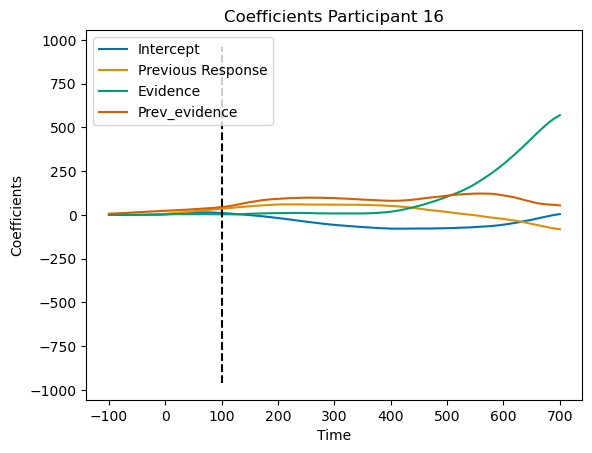

Participant 17, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     6.510
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           0.000235
Time:                        11:18:53   Log-Likelihood:                -4440.2
No. Observations:                 845   AIC:                             8888.
Df Residuals:                     841   BIC:                             8907.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.1872   

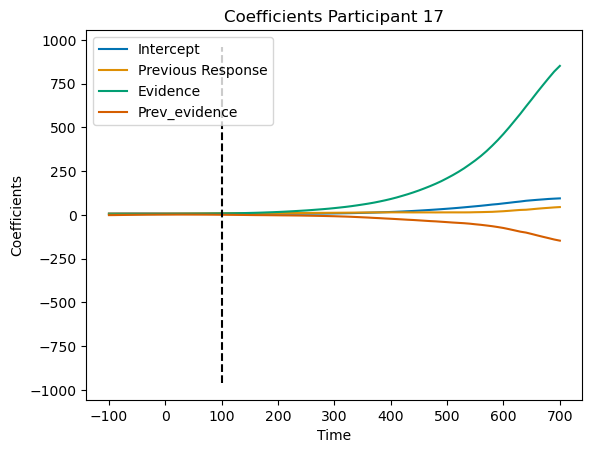

Participant 18, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.419
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.236
Time:                        11:18:54   Log-Likelihood:                -4358.5
No. Observations:                 788   AIC:                             8725.
Df Residuals:                     784   BIC:                             8744.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.8563   

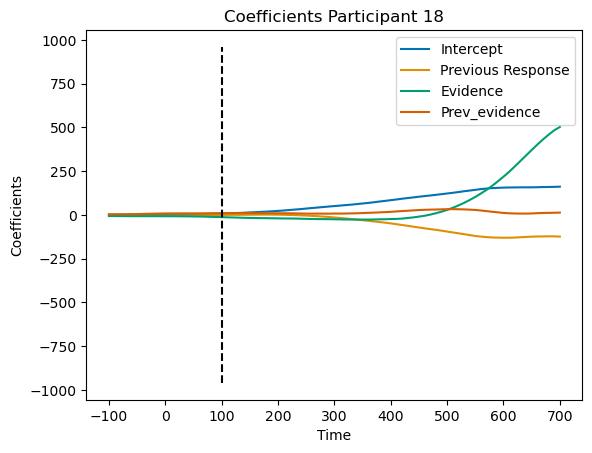

Participant 19, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.850
Date:                Tue, 02 Apr 2024   Prob (F-statistic):             0.0365
Time:                        11:18:56   Log-Likelihood:                -4209.8
No. Observations:                 840   AIC:                             8428.
Df Residuals:                     836   BIC:                             8446.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -4.1597   

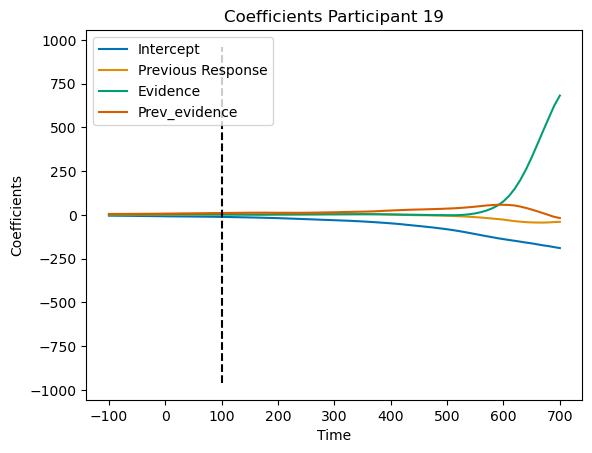

Participant 1, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                   0.01021
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.999
Time:                        11:18:57   Log-Likelihood:                -3725.8
No. Observations:                 806   AIC:                             7460.
Df Residuals:                     802   BIC:                             7478.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.6222    

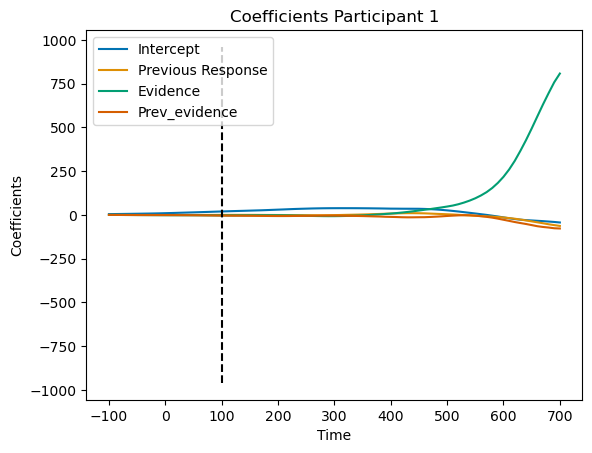

Participant 20, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.024
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     6.752
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           0.000168
Time:                        11:18:59   Log-Likelihood:                -3869.4
No. Observations:                 821   AIC:                             7747.
Df Residuals:                     817   BIC:                             7766.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.8566   

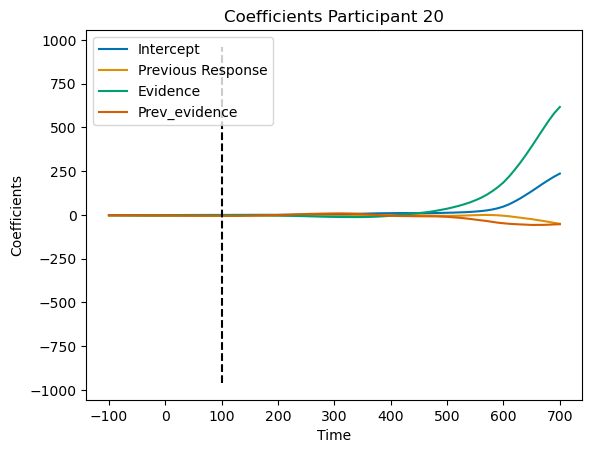

Participant 23, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.325
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.265
Time:                        11:19:00   Log-Likelihood:                -4430.5
No. Observations:                 866   AIC:                             8869.
Df Residuals:                     862   BIC:                             8888.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.4392   

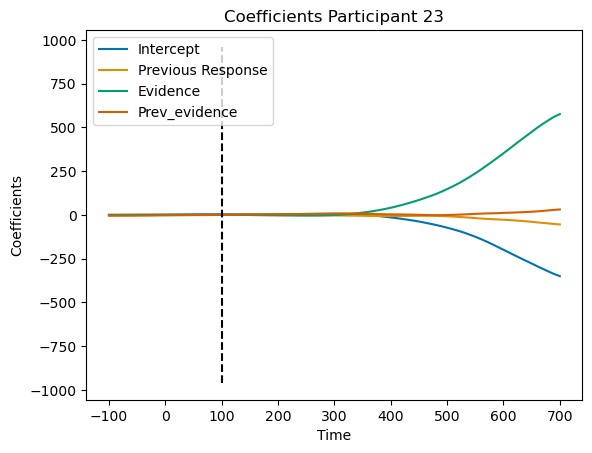

Participant 24, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9960
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.394
Time:                        11:19:02   Log-Likelihood:                -3611.4
No. Observations:                 799   AIC:                             7231.
Df Residuals:                     795   BIC:                             7250.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.1617   

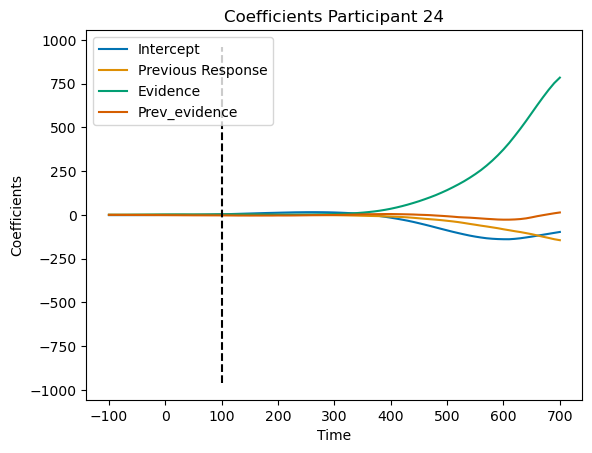

Participant 25, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.4650
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.707
Time:                        11:19:04   Log-Likelihood:                -3340.0
No. Observations:                 815   AIC:                             6688.
Df Residuals:                     811   BIC:                             6707.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2929   

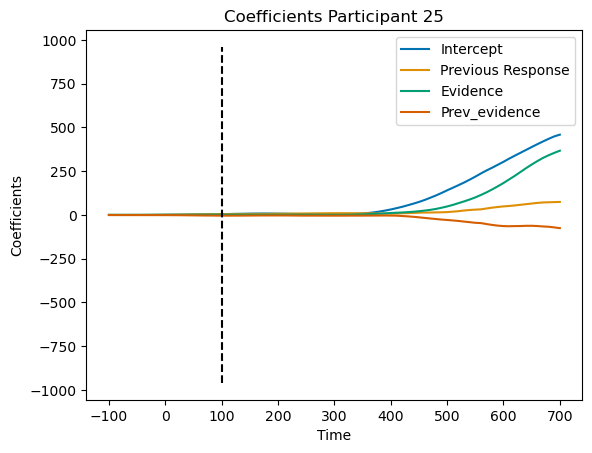

Participant 26, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.012
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.387
Time:                        11:19:05   Log-Likelihood:                -2156.7
No. Observations:                 393   AIC:                             4321.
Df Residuals:                     389   BIC:                             4337.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.9284   

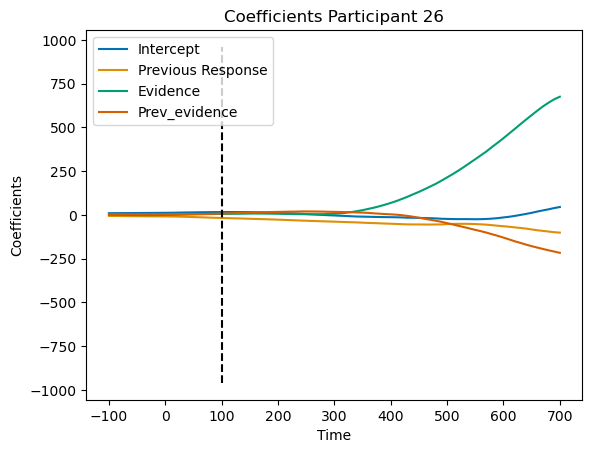

Participant 27, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.024
Model:                            OLS   Adj. R-squared:                  0.020
Method:                 Least Squares   F-statistic:                     7.291
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           7.80e-05
Time:                        11:19:07   Log-Likelihood:                -4554.9
No. Observations:                 912   AIC:                             9118.
Df Residuals:                     908   BIC:                             9137.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -4.4406   

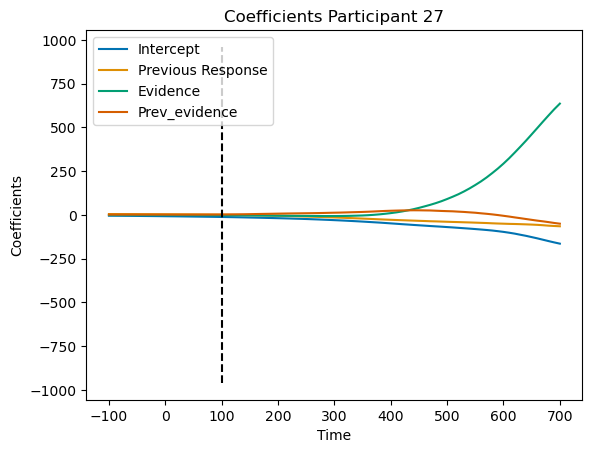

Participant 28, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.027
Method:                 Least Squares   F-statistic:                     8.103
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           2.56e-05
Time:                        11:19:08   Log-Likelihood:                -4359.7
No. Observations:                 770   AIC:                             8727.
Df Residuals:                     766   BIC:                             8746.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.0577   

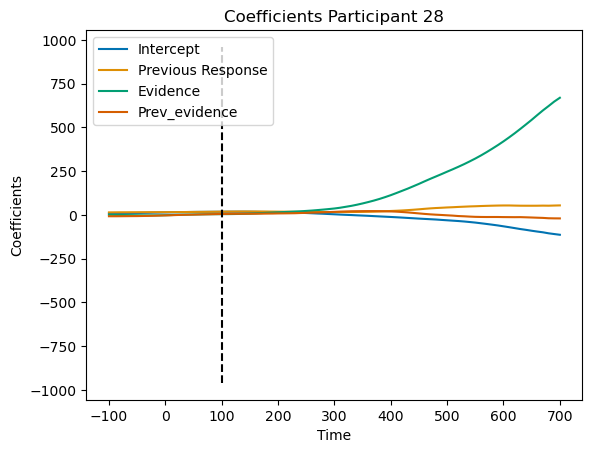

Participant 29, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.018
Method:                 Least Squares   F-statistic:                     6.242
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           0.000341
Time:                        11:19:10   Log-Likelihood:                -4272.1
No. Observations:                 862   AIC:                             8552.
Df Residuals:                     858   BIC:                             8571.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -6.1041   

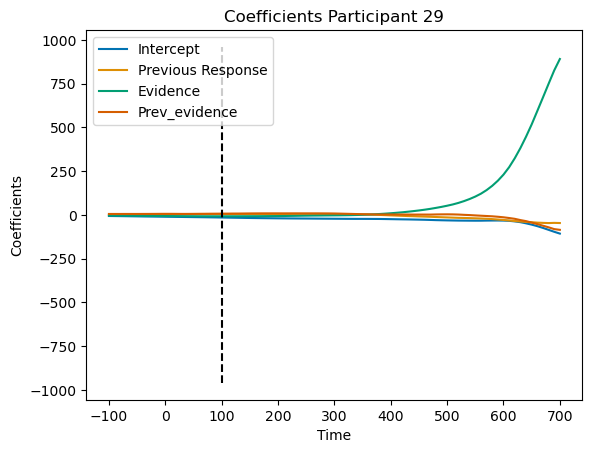

Participant 2, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.000
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.113
Time:                        11:19:11   Log-Likelihood:                -2352.9
No. Observations:                 434   AIC:                             4714.
Df Residuals:                     430   BIC:                             4730.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         18.5394    

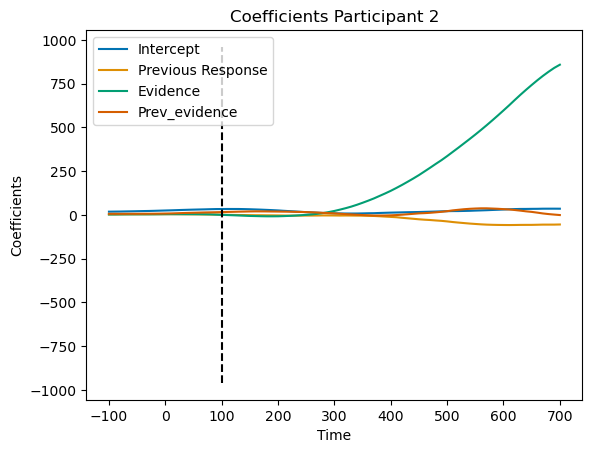

Participant 30, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     6.621
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           0.000201
Time:                        11:19:13   Log-Likelihood:                -4998.3
No. Observations:                 859   AIC:                         1.000e+04
Df Residuals:                     855   BIC:                         1.002e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -19.1300   

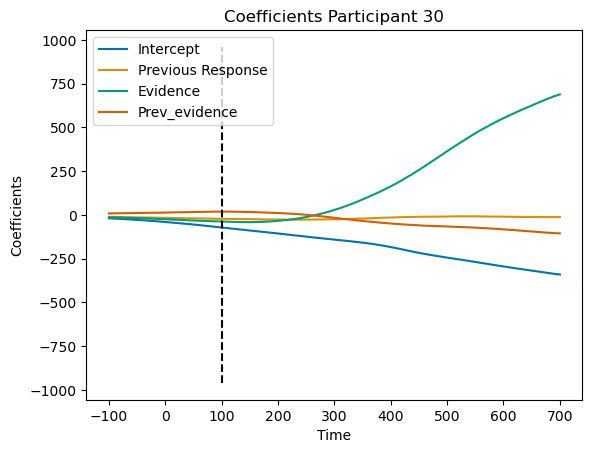

Participant 32, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     3.131
Date:                Tue, 02 Apr 2024   Prob (F-statistic):             0.0250
Time:                        11:19:14   Log-Likelihood:                -4412.1
No. Observations:                 853   AIC:                             8832.
Df Residuals:                     849   BIC:                             8851.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.3284   

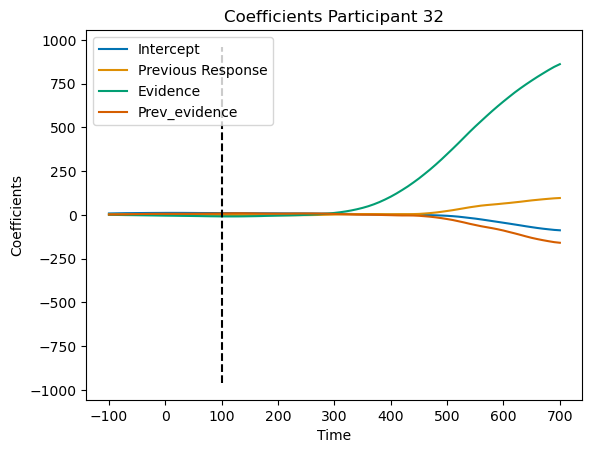

Participant 33, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.1933
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.901
Time:                        11:19:16   Log-Likelihood:                -4967.0
No. Observations:                 815   AIC:                             9942.
Df Residuals:                     811   BIC:                             9961.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.5159   

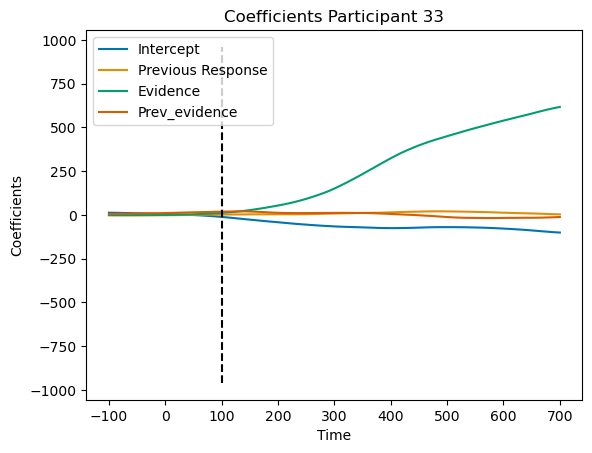

Participant 34, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     8.144
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           2.45e-05
Time:                        11:19:17   Log-Likelihood:                -4732.7
No. Observations:                 713   AIC:                             9473.
Df Residuals:                     709   BIC:                             9492.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -22.3932   

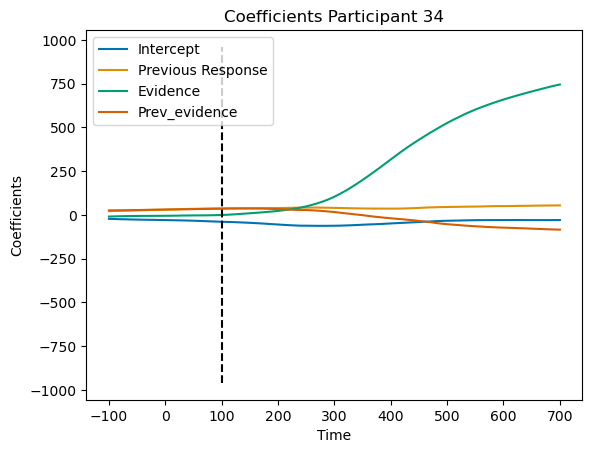

Participant 36, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.1791
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.911
Time:                        11:19:19   Log-Likelihood:                -4128.3
No. Observations:                 864   AIC:                             8265.
Df Residuals:                     860   BIC:                             8284.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2536   

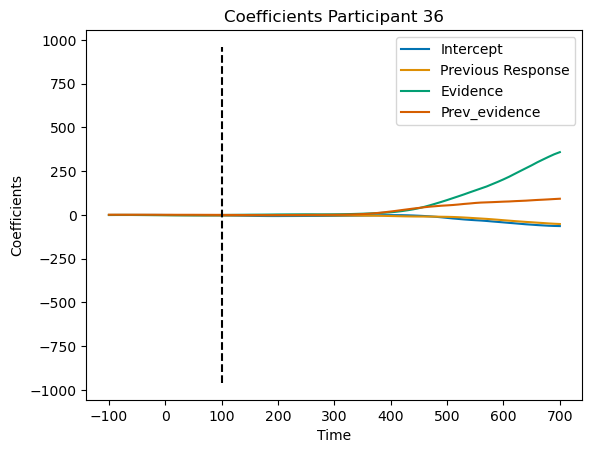

Participant 37, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.6867
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.560
Time:                        11:19:20   Log-Likelihood:                -4576.4
No. Observations:                 843   AIC:                             9161.
Df Residuals:                     839   BIC:                             9180.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1204   

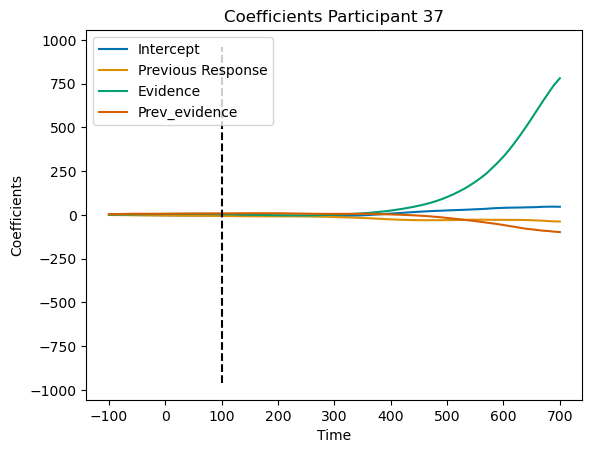

Participant 38, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     4.410
Date:                Tue, 02 Apr 2024   Prob (F-statistic):            0.00437
Time:                        11:19:22   Log-Likelihood:                -3494.4
No. Observations:                 785   AIC:                             6997.
Df Residuals:                     781   BIC:                             7016.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.1364   

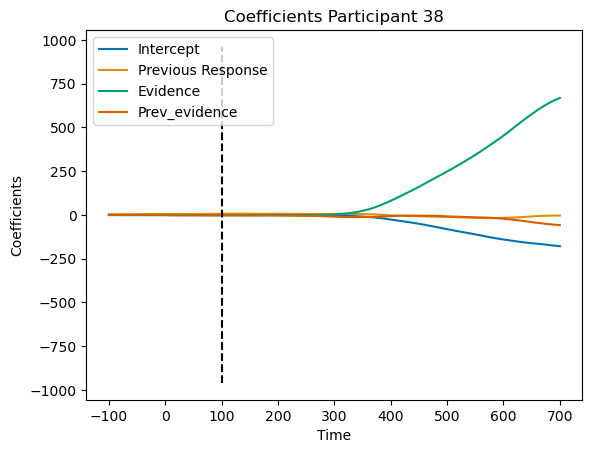

Participant 39, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     6.649
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           0.000193
Time:                        11:19:24   Log-Likelihood:                -5245.2
No. Observations:                 891   AIC:                         1.050e+04
Df Residuals:                     887   BIC:                         1.052e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         30.6968   

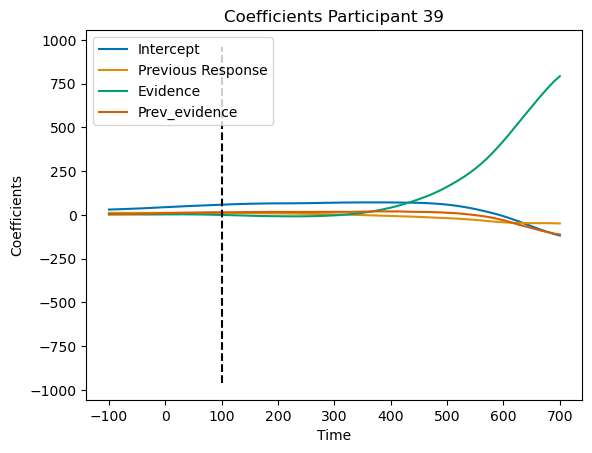

Participant 3, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.7262
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.537
Time:                        11:19:26   Log-Likelihood:                -3390.6
No. Observations:                 704   AIC:                             6789.
Df Residuals:                     700   BIC:                             6808.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.8337    

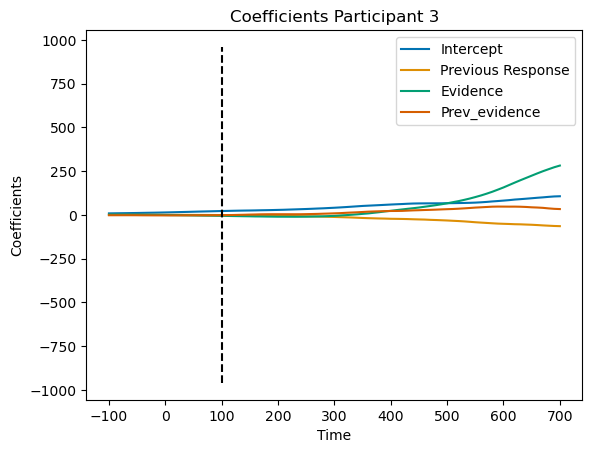

Participant 40, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.027
Method:                 Least Squares   F-statistic:                     7.699
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           4.56e-05
Time:                        11:19:27   Log-Likelihood:                -4001.8
No. Observations:                 721   AIC:                             8012.
Df Residuals:                     717   BIC:                             8030.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         17.5739   

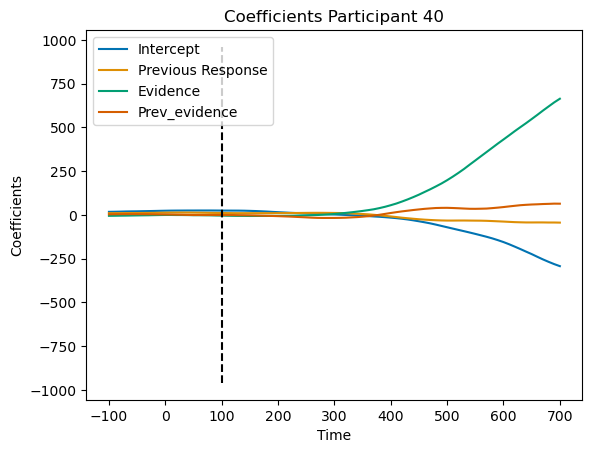

Participant 41, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.536
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.204
Time:                        11:19:30   Log-Likelihood:                -3890.0
No. Observations:                 741   AIC:                             7788.
Df Residuals:                     737   BIC:                             7807.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3766   

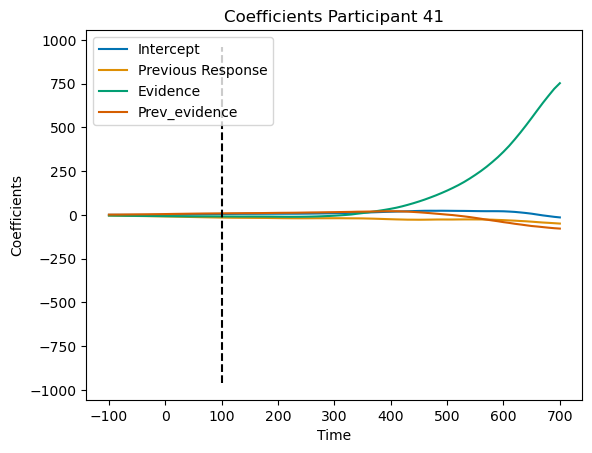

Participant 42, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.989
Date:                Tue, 02 Apr 2024   Prob (F-statistic):             0.0303
Time:                        11:19:33   Log-Likelihood:                -4339.9
No. Observations:                 896   AIC:                             8688.
Df Residuals:                     892   BIC:                             8707.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.0151   

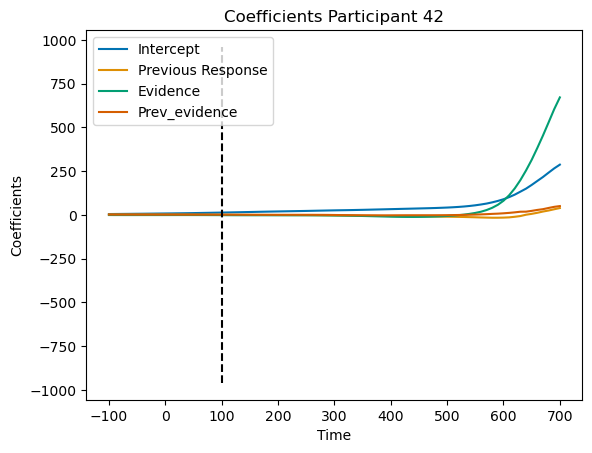

Participant 43, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     2.197
Date:                Tue, 02 Apr 2024   Prob (F-statistic):             0.0877
Time:                        11:19:36   Log-Likelihood:                -2911.8
No. Observations:                 464   AIC:                             5832.
Df Residuals:                     460   BIC:                             5848.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -6.5481   

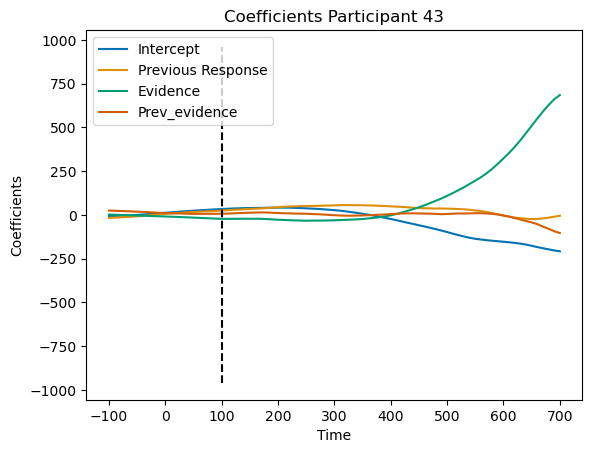

Participant 45, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     2.078
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.102
Time:                        11:19:38   Log-Likelihood:                -3817.6
No. Observations:                 784   AIC:                             7643.
Df Residuals:                     780   BIC:                             7662.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.8066   

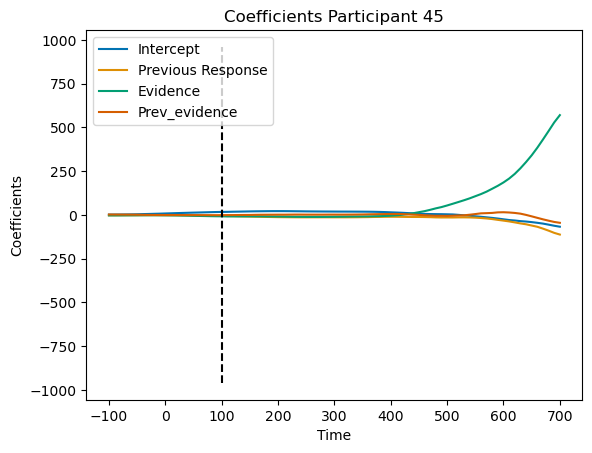

Participant 46, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.4278
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.733
Time:                        11:19:40   Log-Likelihood:                -2064.1
No. Observations:                 539   AIC:                             4136.
Df Residuals:                     535   BIC:                             4153.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.2690   

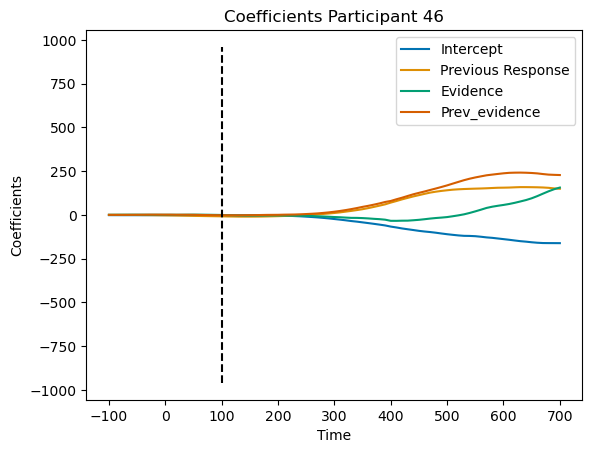

Participant 47, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.2774
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.842
Time:                        11:19:42   Log-Likelihood:                -3711.4
No. Observations:                 692   AIC:                             7431.
Df Residuals:                     688   BIC:                             7449.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.8227   

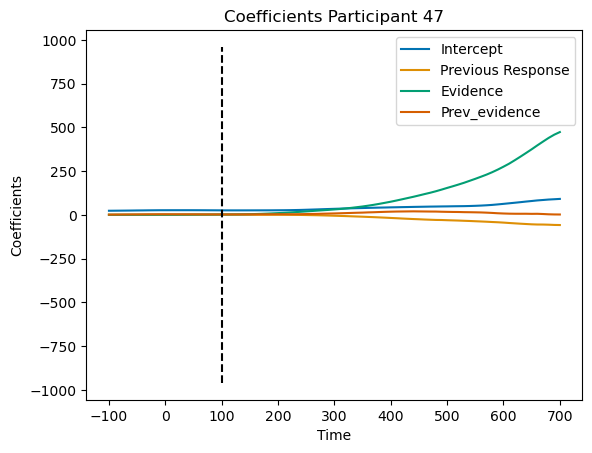

Participant 48, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     2.835
Date:                Tue, 02 Apr 2024   Prob (F-statistic):             0.0373
Time:                        11:19:44   Log-Likelihood:                -4062.3
No. Observations:                 866   AIC:                             8133.
Df Residuals:                     862   BIC:                             8152.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1179   

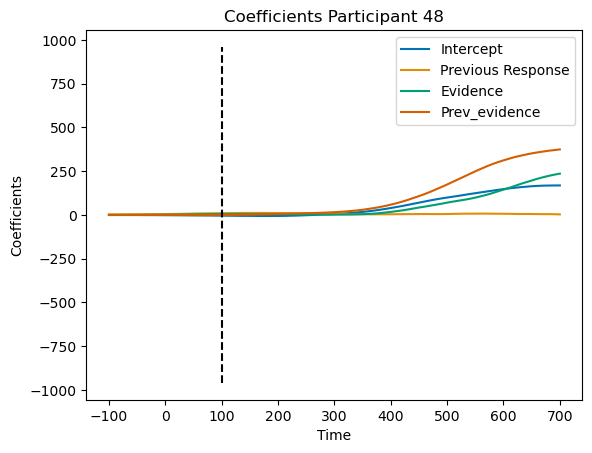

Participant 49, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.5588
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.642
Time:                        11:19:46   Log-Likelihood:                -4266.1
No. Observations:                 803   AIC:                             8540.
Df Residuals:                     799   BIC:                             8559.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.9138   

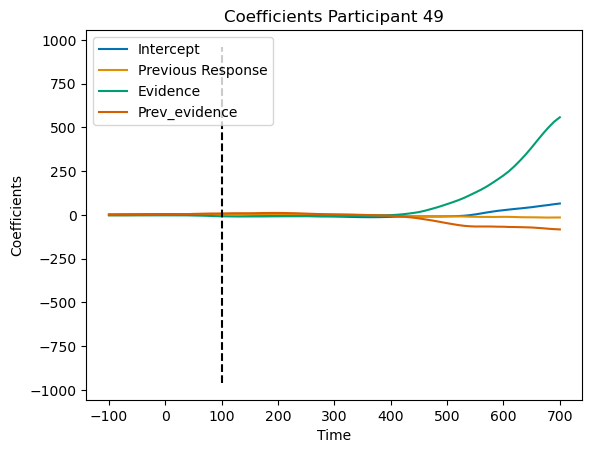

Participant 4, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     4.119
Date:                Tue, 02 Apr 2024   Prob (F-statistic):            0.00649
Time:                        11:19:48   Log-Likelihood:                -4097.6
No. Observations:                 884   AIC:                             8203.
Df Residuals:                     880   BIC:                             8222.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.0155    

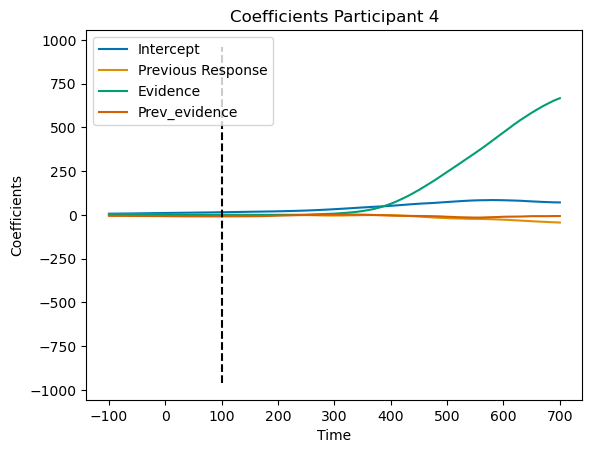

Participant 50, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.050
Model:                            OLS   Adj. R-squared:                  0.046
Method:                 Least Squares   F-statistic:                     13.92
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           7.53e-09
Time:                        11:19:50   Log-Likelihood:                -4258.6
No. Observations:                 797   AIC:                             8525.
Df Residuals:                     793   BIC:                             8544.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.1770   

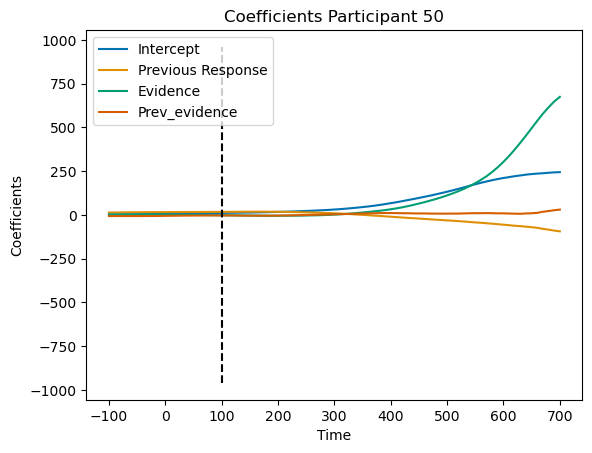

Participant 52, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.152
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.327
Time:                        11:19:51   Log-Likelihood:                -3906.5
No. Observations:                 846   AIC:                             7821.
Df Residuals:                     842   BIC:                             7840.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1069   

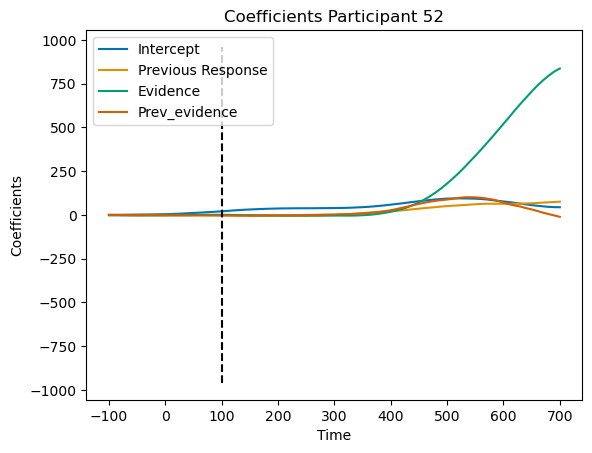

Participant 53, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.396
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.243
Time:                        11:19:53   Log-Likelihood:                -2090.2
No. Observations:                 424   AIC:                             4188.
Df Residuals:                     420   BIC:                             4205.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.4177   

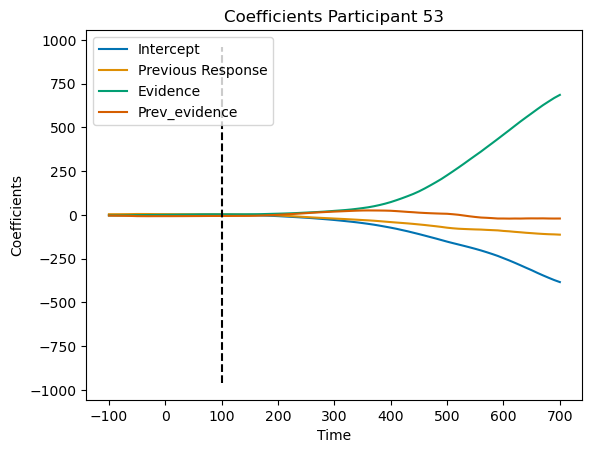

Participant 54, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.916
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.125
Time:                        11:19:55   Log-Likelihood:                -4730.4
No. Observations:                 884   AIC:                             9469.
Df Residuals:                     880   BIC:                             9488.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.8976   

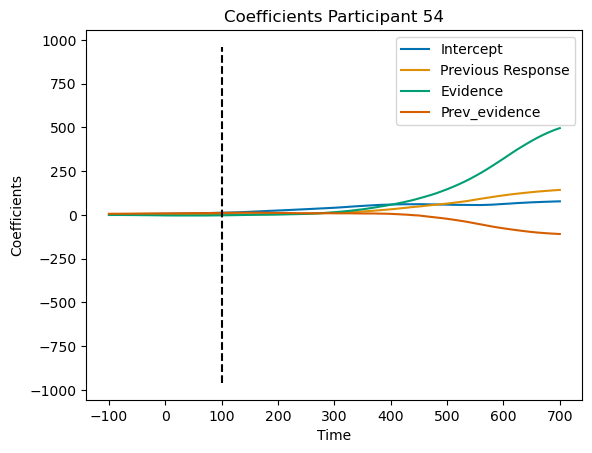

Participant 55, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.005
Method:                 Least Squares   F-statistic:                   0.05075
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.985
Time:                        11:19:56   Log-Likelihood:                -3453.3
No. Observations:                 626   AIC:                             6915.
Df Residuals:                     622   BIC:                             6932.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         22.0640   

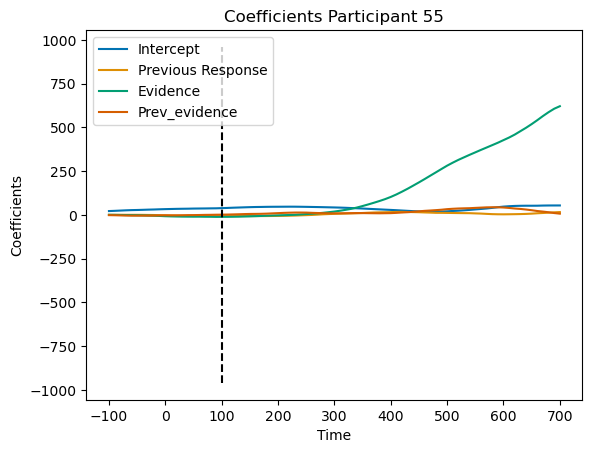

Participant 56, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     5.138
Date:                Tue, 02 Apr 2024   Prob (F-statistic):            0.00169
Time:                        11:19:58   Log-Likelihood:                -2647.7
No. Observations:                 418   AIC:                             5303.
Df Residuals:                     414   BIC:                             5320.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         30.3088   

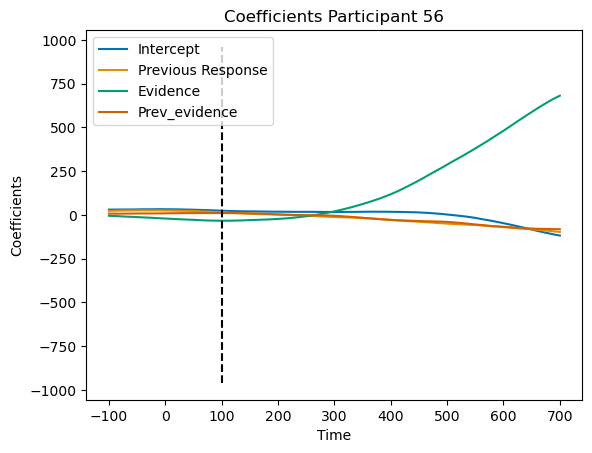

Participant 57, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.3262
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.806
Time:                        11:20:00   Log-Likelihood:                -5130.5
No. Observations:                 853   AIC:                         1.027e+04
Df Residuals:                     849   BIC:                         1.029e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         54.6574   

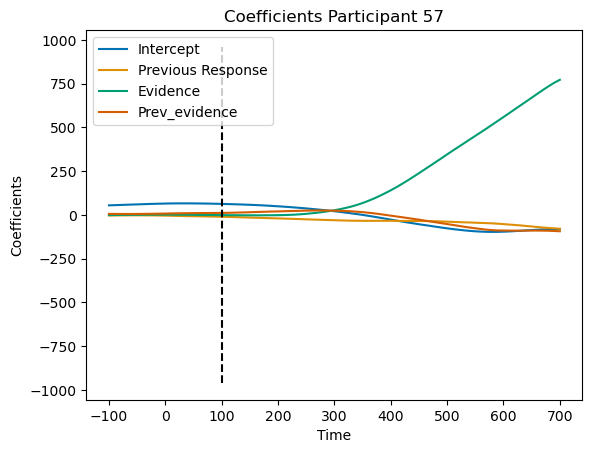

Participant 58, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     3.309
Date:                Tue, 02 Apr 2024   Prob (F-statistic):             0.0201
Time:                        11:20:02   Log-Likelihood:                -2089.0
No. Observations:                 428   AIC:                             4186.
Df Residuals:                     424   BIC:                             4202.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.2884   

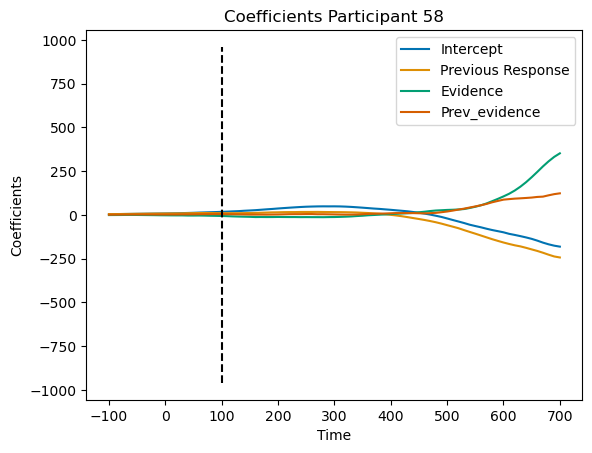

Participant 6, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.6370
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.591
Time:                        11:20:03   Log-Likelihood:                -5128.9
No. Observations:                 918   AIC:                         1.027e+04
Df Residuals:                     914   BIC:                         1.028e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -10.9261    

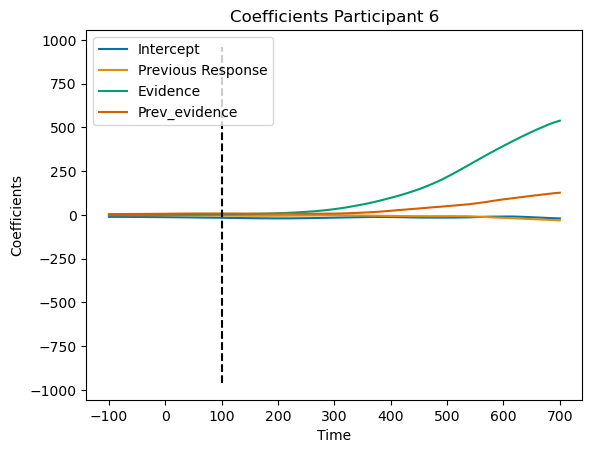

Participant 7, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     2.033
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.108
Time:                        11:20:05   Log-Likelihood:                -4049.7
No. Observations:                 861   AIC:                             8107.
Df Residuals:                     857   BIC:                             8126.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.8003    

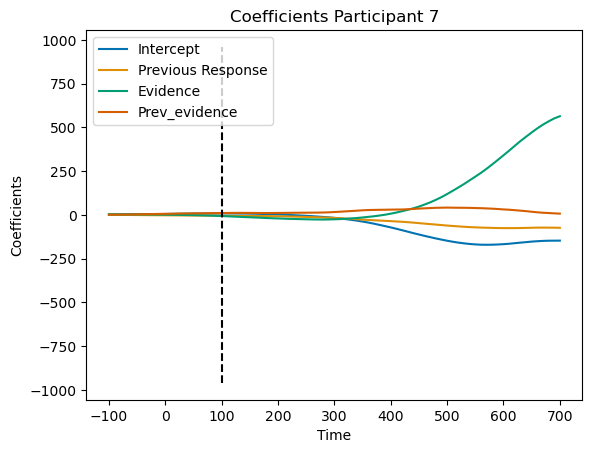

Participant 8, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.692
Date:                Tue, 02 Apr 2024   Prob (F-statistic):              0.167
Time:                        11:20:07   Log-Likelihood:                -4905.2
No. Observations:                 874   AIC:                             9818.
Df Residuals:                     870   BIC:                             9838.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.6687    

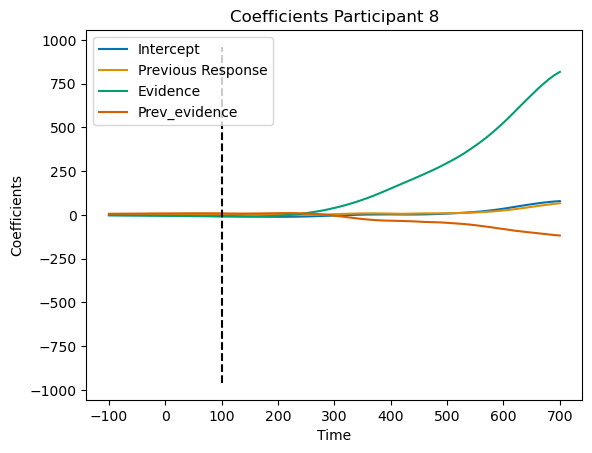

Participant 9, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     4.634
Date:                Tue, 02 Apr 2024   Prob (F-statistic):            0.00319
Time:                        11:20:09   Log-Likelihood:                -5319.1
No. Observations:                 874   AIC:                         1.065e+04
Df Residuals:                     870   BIC:                         1.067e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -44.4929    

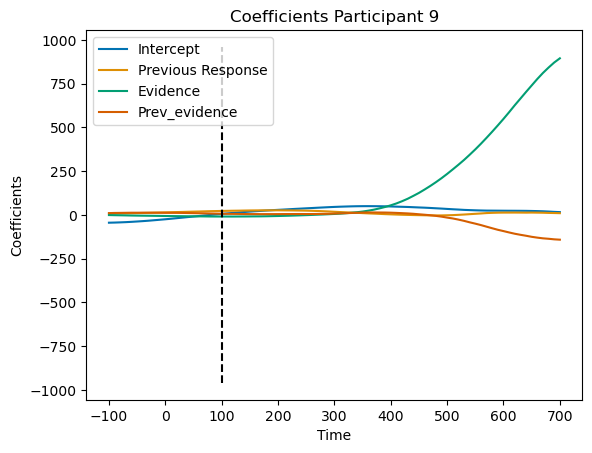

In [13]:
######################################
#Previous Response
######################################
time = list(range(-100, 71 * 10, 10))
#df_lm = df[df['true_value'] != 'Control']
df_lm = df_11[df_11['previous_response'] != 'NAN']
df_lm['previous_response'] = df_lm['previous_response'].apply(lambda x: 1 if x == 'Red' else - 1)
# Get the unique participant numbers
participants = df_lm['pt_num'].unique()
all_coefs = []
# Iterate over each participant
for participant in participants:
    # Filter the dataframe for the current participant
    df_lm_participant = df_lm[df_lm['pt_num'] == participant]
    # One-hot encode the categorical predictor 'true_value'
    #df_encoded_participant = pd.get_dummies(df_lm_participant, columns=['previous_response'])
    df_encoded_participant = df_lm_participant
    

    # Drop rows with missing values
    df_cleaned_participant = df_encoded_participant.dropna()

    coefs = []
    for i in range(0, 81):
        # Extract the dependent variable
        first_values = df_cleaned_participant['x_values'].apply(lambda x: x[i])
        y = np.array(first_values).astype(int)

        # Extract the independent variables
        X_categorical = df_cleaned_participant[['previous_response']].values
        
        X_numerical = df_cleaned_participant['muval_rescaled'].values.reshape(-1, 1)
        X_numerical_2 = df_cleaned_participant['prev_evidence_rescaled'].values.reshape(-1, 1)
        #X_numerical = np.abs(X_numerical)

        # Add interaction term
        #interaction_term = X_categorical * X_numerical

        # Concatenate predictors and interaction term
        X = np.concatenate((X_categorical, X_numerical, X_numerical_2), axis=1)

        # Add constant term for intercept
        X = sm.add_constant(X)

        # Perform linear regression
        model = sm.OLS(y, X).fit()

        # Append coefficients to the list
        coefs.append((model.params[0], model.params[1], model.params[2], model.params[3]))

        # Print the summary of the regression results
        print(f"Participant {participant}, Iteration {i+1}")
        print(model.summary())
    plt.plot(time, coefs)
    plt.xlabel('Time')
    plt.ylabel('Coefficients')
    plt.title(f'Coefficients ' + f'Participant {participant}')
    plt.vlines(100, -960, 960, colors='black', linestyles='dashed')
    plt.legend(['Intercept',"Previous Response",'Evidence', 'Prev_evidence'])
    plt.show()
    all_coefs.append(coefs)


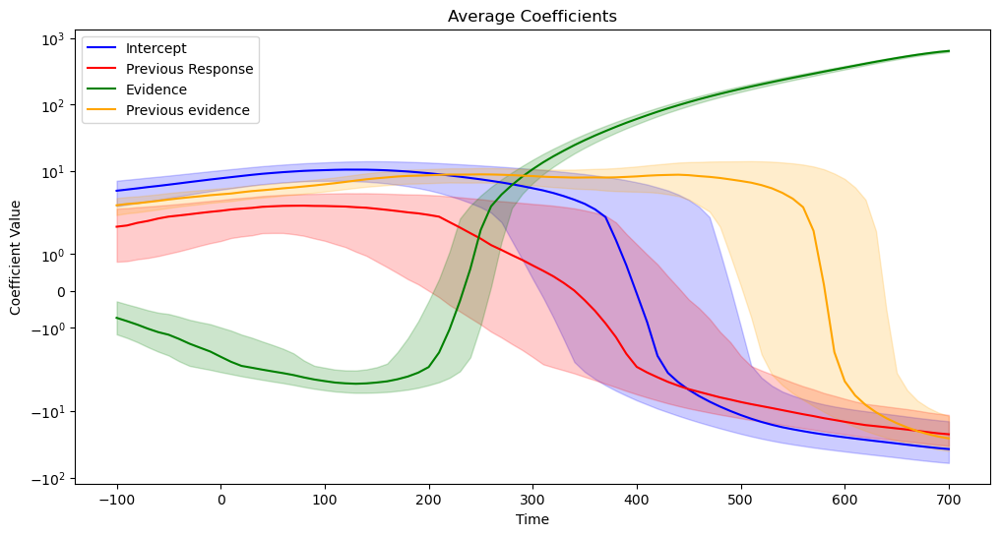

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interactive

# Convert the list of coefficients to a numpy array
all_coefs_array = np.array(all_coefs)

# Calculate the average of each coefficient across all samples
average_coefs = np.mean(all_coefs_array, axis=0)


# Extract the x, y, and z values of the coefficients
intercept_coefs = average_coefs[:, 0]
prv_resp_coefs = average_coefs[:, 1]
evidence_coefs = average_coefs[:, 2]
prv_evidence_coefs = average_coefs[:, 3]

# Calculate the standard error of each coefficient across all samples
std_coefs = np.std(all_coefs_array, axis=0, ddof=1) / np.sqrt(all_coefs_array.shape[0])


plt.figure(figsize=(12, 6))
plt.plot(time, intercept_coefs, label='Intercept', color='blue')
plt.plot(time, prv_resp_coefs, label='Previous Response', color='red')
plt.plot(time, evidence_coefs, label='Evidence', color='green')
plt.plot(time, prv_evidence_coefs, label='Previous evidence', color='orange')
plt.fill_between(time, intercept_coefs - std_coefs[:, 0], intercept_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, prv_resp_coefs - std_coefs[:, 1], prv_resp_coefs + std_coefs[:, 1], alpha=0.2, color='red')
plt.fill_between(time, evidence_coefs - std_coefs[:, 2], evidence_coefs + std_coefs[:, 2], alpha=0.2, color='green')
plt.fill_between(time, prv_evidence_coefs - std_coefs[:, 3], prv_evidence_coefs + std_coefs[:, 3], alpha=0.2, color='orange')
plt.xlabel('Time')
plt.ylabel('Coefficient Value')
#plt.yscale('log')
plt.title('Average Coefficients')
# Add the regression formula as text
#plt.text(10, 850, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
#plt.text(170, 850, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
#plt.text(205, 850, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
#plt.text(305, 850, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
#plt.xticks(np.arange(-100, 710, 100))
#plt.ylim(-100, 960)
#plt.vlines(0, -960, 960, colors='orange', linestyles='dashed')
plt.legend()
plt.yscale('symlog')
#plt.xlim(min(time), max(time))  # Use min() and max() to find the limits
#plt.ylim(-100, x_coefs.max() + factor)
plt.show()

# Assuming your average coefs data is stored in the variable 'average_coefs'
#log_average_coefs = np.log(average_coefs)


In [35]:
import numpy as np
from scipy.stats import ttest_1samp
from statsmodels.stats.multitest import multipletests

# Assuming `all_coefs_array` is a 3D array with shape (participants, coefficients, predictors)
# Modify this part according to your actual data structure

# Reshape the array to swap the dimensions so that each row corresponds to a coefficient across all participants
all_coefs_array_reshaped = np.swapaxes(all_coefs_array, 0, 1)  # Shape: (coefficients, participants, predictors)

# Initialize arrays to store t-statistics and p-values
# We have 81 datapoints per coefficient and 4 predictors, hence the shape (81, 4)
t_statistics = np.zeros((81, 4))  
p_values = np.zeros((81, 4))
p_indices = []      

# Loop over each coefficient
for i, coefficient_data in enumerate(all_coefs_array_reshaped):
    # Loop over each predictor
    for j in range(4):  
        # Perform a one-sample t-test for the current coefficient's data
        # The null hypothesis is that the mean of the data is 0
        t_statistic, p_value = ttest_1samp(coefficient_data[:, j], 0)
        
        # Store the t-statistic and p-value
        t_statistics[i, j] = t_statistic
        p_values[i, j] = p_value

# Apply False Discovery Rate (FDR) correction to p-values for each predictor
# This is done to control the expected proportion of incorrectly rejected null hypotheses (type I errors)
reject, corrected_p_values, _, _ = multipletests(p_values.flatten(), method='bonferroni')

# Reshape the corrected p-values to have the same shape as the original p-values
corrected_p_values = corrected_p_values.reshape(p_values.shape)

# Loop over each predictor
for predictor_idx, predictor_p_values in enumerate(corrected_p_values.T):
    # Find the indices of the coefficients for which the corrected p-value is less than 0.05
    # These are the coefficients for which the effect of the predictor is statistically significant
    significant_indices = np.where(predictor_p_values < 0.05)[0]
    p_indices.append(significant_indices)
    # Get the significant t-statistics and p-values
    significant_t_statistics = t_statistics[significant_indices, predictor_idx]
    significant_p_values = predictor_p_values[significant_indices]
    
    # Print the significant results
    for idx, t_statistic, p_value in zip(significant_indices, significant_t_statistics, significant_p_values):
        print(f"Predictor {predictor_idx+1}, Coefficient {idx}: t-statistic = {t_statistic}, p-value (FDR corrected) = {p_value}")

Predictor 3, Coefficient 45: t-statistic = 4.3383811978712075, p-value (FDR corrected) = 0.02257052690119897
Predictor 3, Coefficient 46: t-statistic = 4.674232679091185, p-value (FDR corrected) = 0.007340419261620538
Predictor 3, Coefficient 47: t-statistic = 5.007612308556809, p-value (FDR corrected) = 0.0023458587517999037
Predictor 3, Coefficient 48: t-statistic = 5.3542689214139285, p-value (FDR corrected) = 0.0007010542641081102
Predictor 3, Coefficient 49: t-statistic = 5.704910410607711, p-value (FDR corrected) = 0.00020311812775704872
Predictor 3, Coefficient 50: t-statistic = 6.045468451123245, p-value (FDR corrected) = 6.02709529898553e-05
Predictor 3, Coefficient 51: t-statistic = 6.424379564684429, p-value (FDR corrected) = 1.5463018919693643e-05
Predictor 3, Coefficient 52: t-statistic = 6.8227339480486835, p-value (FDR corrected) = 3.682627492448905e-06
Predictor 3, Coefficient 53: t-statistic = 7.232834203578717, p-value (FDR corrected) = 8.408421181115253e-07
Predictor

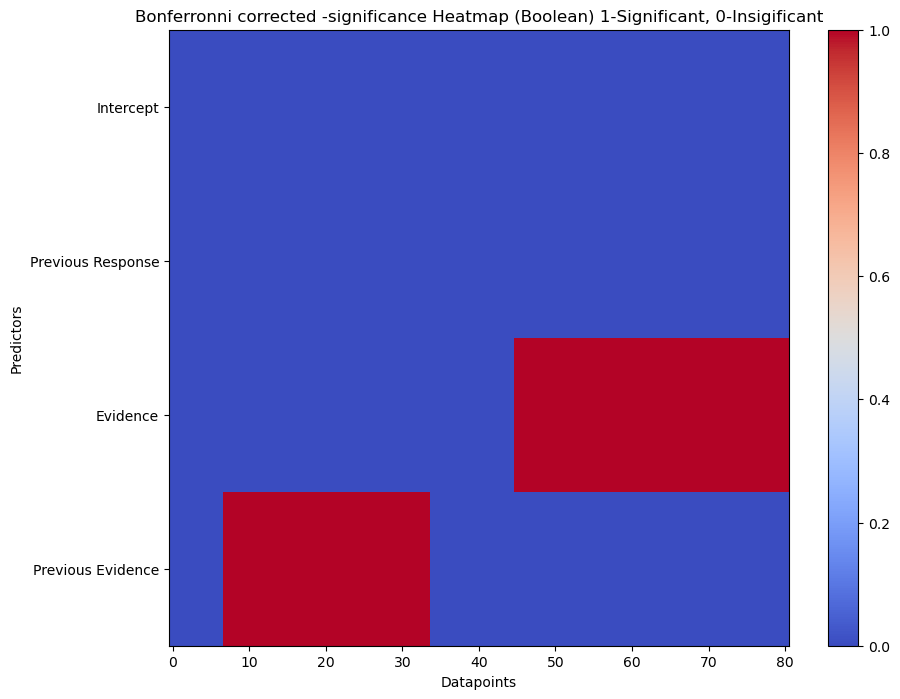

In [36]:
import matplotlib.pyplot as plt

# Create a heatmap of p-values
swp = corrected_p_values.swapaxes(0, 1)
plt.figure(figsize=(10, 8))
plt.imshow(swp < 0.05, cmap='coolwarm', aspect='auto', vmin=0, vmax=1)  # Setting vmin=0 and vmax=1 to ensure p-values are within the colormap range
plt.colorbar()
plt.xlabel('Datapoints')
plt.ylabel('Predictors')
plt.title('Bonferronni corrected -significance Heatmap (Boolean) 1-Significant, 0-Insigificant')
plt.xticks(range(81)[::10], range(81)[::10])  # Adjust ticks for better readability
plt.yticks(range(4), ['Intercept', 'Previous Response', 'Evidence', 'Previous Evidence'])  # Adjust labels for predictors
plt.show()

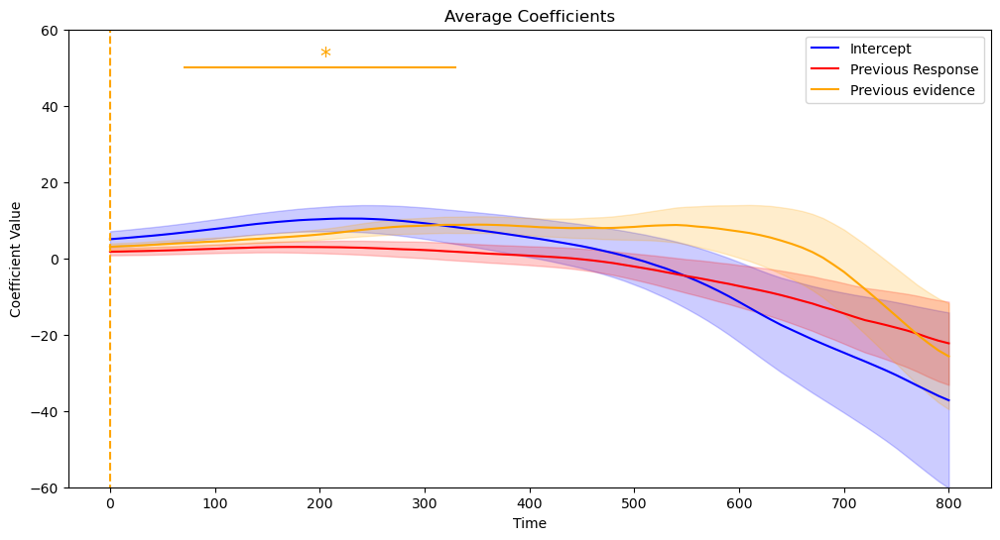

In [37]:
### Static Plot without Evidence
p_indices = [10 * value for value in p_indices]

time = list(range(0, 81 * 10, 10))
plt.figure(figsize=(12, 6))
plt.plot(time, intercept_coefs, label='Intercept', color='blue')
plt.plot(time, prv_resp_coefs, label='Previous Response', color='red')
plt.plot(time, prv_evidence_coefs, label='Previous evidence', color='orange')
plt.fill_between(time, intercept_coefs - std_coefs[:, 0], intercept_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, prv_resp_coefs - std_coefs[:, 1], prv_resp_coefs + std_coefs[:, 1], alpha=0.2, color='red')
plt.fill_between(time, prv_evidence_coefs - std_coefs[:, 3], prv_evidence_coefs + std_coefs[:, 3], alpha=0.2, color='orange')
plt.xlabel('Time')
plt.ylabel('Coefficient Value')
plt.title('Average Coefficients')
# Add the regression formula as text
#plt.text(10, 850, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
#plt.text(170, 850, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
#plt.text(205, 850, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
#plt.text(305, 850, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
#

#Adding significant points
#Intercept
#plt.hlines(25, min(p_indices[0]), max(p_indices[0]), colors='blue', linestyles='solid')
#plt.text(120, 25, '*', color='blue', fontsize=16, verticalalignment='bottom')
# Previous Response
#plt.hlines(-10, min(p_indices[1]), max(p_indices[1]), colors='red', linestyles='solid')
#plt.text(np.mean(p_indices[1]), -10, '*', color='red', fontsize=16, verticalalignment='bottom')
# Previous Evidence
plt.hlines(50, min(p_indices[3]), max(p_indices[3]), colors='orange', linestyles='solid')
plt.text(np.mean(p_indices[3]), 50, '*', color='orange', fontsize=16, verticalalignment='bottom')

plt.xticks(np.arange(0, 810, 100))
plt.ylim(-60, 60)
plt.vlines(0, -70, 60, colors='orange', linestyles='dashed')
#plt.grid(True)
plt.yscale('linear')
plt.legend()
#plt.xlim(min(time), max(time))  # Use min() and max() to find the limits
#plt.ylim(-100, intercept_coefs.max())
plt.show()

In [38]:
p_indices

[array([], dtype=int64),
 array([], dtype=int64),
 array([450, 460, 470, 480, 490, 500, 510, 520, 530, 540, 550, 560, 570,
        580, 590, 600, 610, 620, 630, 640, 650, 660, 670, 680, 690, 700,
        710, 720, 730, 740, 750, 760, 770, 780, 790, 800], dtype=int64),
 array([ 70,  80,  90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190,
        200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320,
        330], dtype=int64)]